# Visualize Data with and without anomalies

To do:
* Need data without anomalies to train with.

### IMU Data

In [17]:
import glob
import pandas as pd

# Path to the folder containing the CSV files
folder_path = "TFO Data\IMU"

# Get the list of CSV files in the folder
file_list = glob.glob(folder_path + "\*.csv")

# Iterate over each file
for file_path in file_list:
    # Read the CSV file into a pandas dataframe
    df = pd.read_csv(file_path)
    
    # Show the head of the dataframe
    title = file_path.split("\\")[-1]
    print(f"Head of {title}:")
    print(df.head())
    print()

Head of P19V1_20.csv:
  time  index    ax1    ay1    az1    gx1    gy1    gz1    ax2    ay2    az2  \
0  NaN     85  0.042 -0.434 -0.837 -1.717  1.022  0.816  0.133  0.005 -1.031   
1  NaN    176  0.043 -0.437 -0.842 -1.846  0.916  0.496  0.135  0.005 -1.027   
2  NaN    267  0.044 -0.434 -0.839 -1.717  1.289  0.687  0.133  0.004 -1.028   
3  NaN    358  0.040 -0.438 -0.836 -1.724  1.106  0.732  0.135  0.005 -1.026   
4  NaN    449  0.044 -0.438 -0.838 -1.671  1.022  0.534  0.135  0.003 -1.023   

     gx2    gy2    gz2  temperature  
0 -3.113  1.747 -1.862          0.0  
1 -2.853  1.717 -1.869          0.0  
2 -2.350  1.785 -1.801          0.0  
3 -2.396  1.831 -1.640          0.0  
4 -2.335  1.923 -1.404          0.0  

Head of P19V1_F5.csv:
  time  index    ax1    ay1    az1    gx1    gy1    gz1    ax2    ay2    az2  \
0  NaN     85 -0.102 -0.447 -0.816 -2.319  2.182  0.282  0.129 -0.147 -1.006   
1  NaN    176 -0.103 -0.444 -0.816 -2.739  1.976 -0.031  0.127 -0.146 -1.005   
2  NaN

Plot of P19V1_20.csv


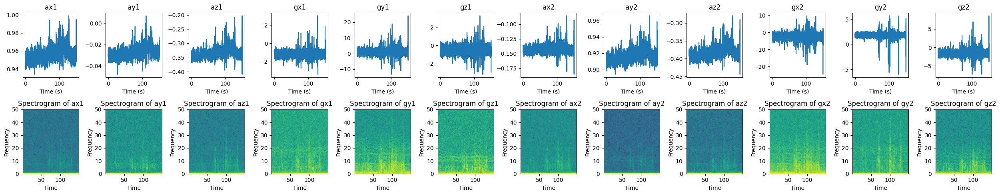

Plot of P19V1_F5.csv


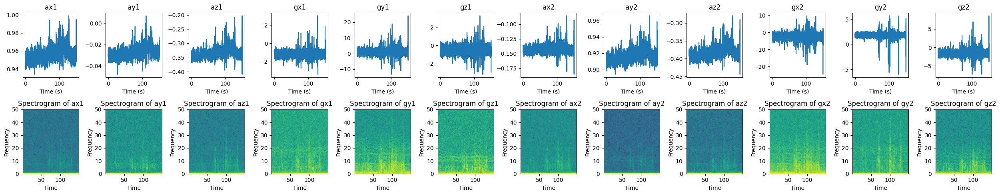

Plot of P19V1_L5.csv


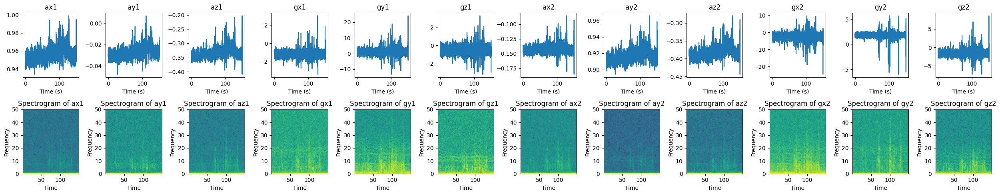

Plot of P19V2_20.csv


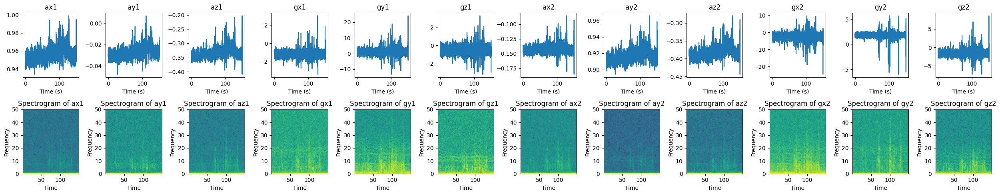

Plot of P19V2_F5.csv


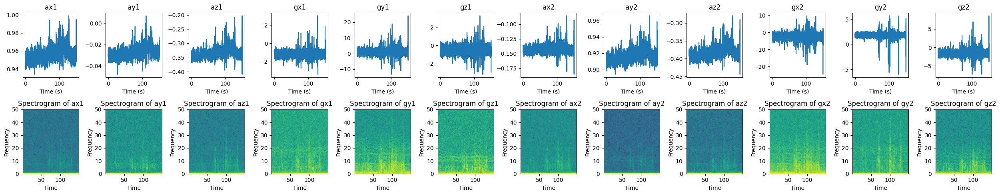

Plot of P19V2_L5.csv


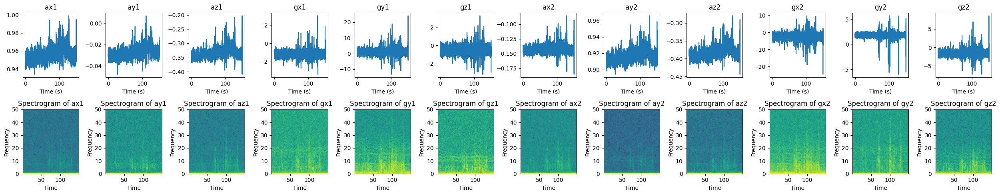

Plot of P20V1_20.csv


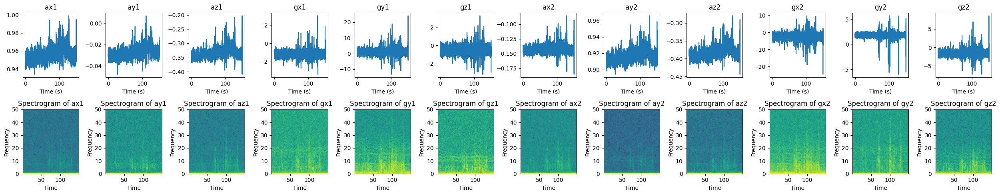

Plot of P20V1_F5.csv


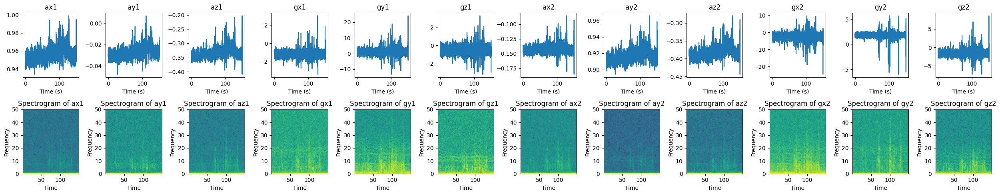

Plot of P20V1_L5.csv


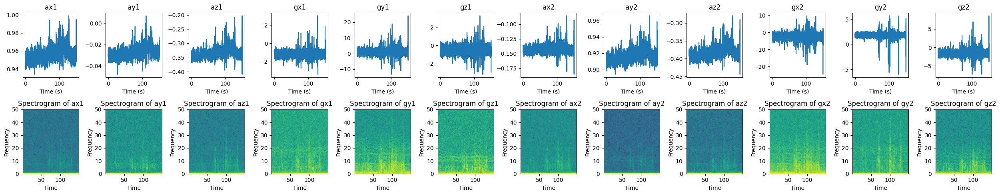

Plot of P20V2_20_1.csv


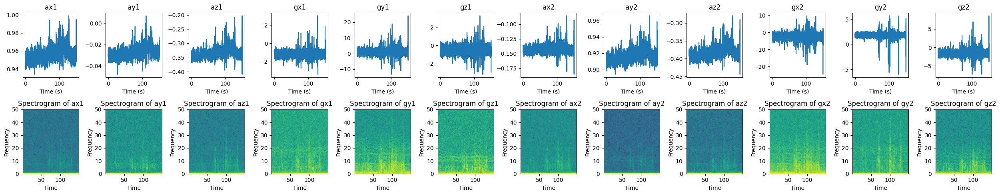

Plot of P20V2_20_2.csv


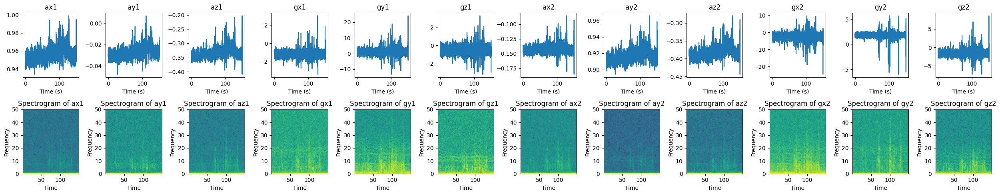

Plot of P20V2_F5.csv


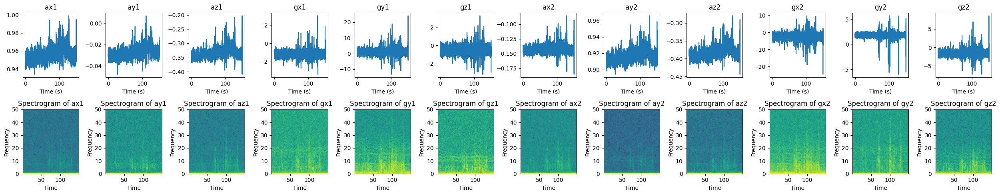

Plot of P20V2_L5.csv


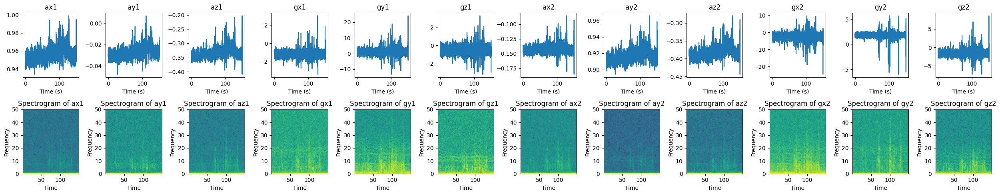

Plot of P20V3_20_1.csv


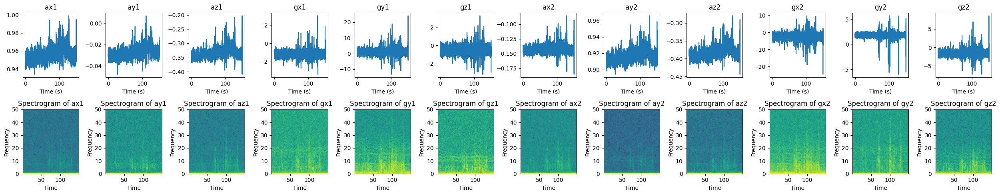

Plot of P20V3_20_2.csv


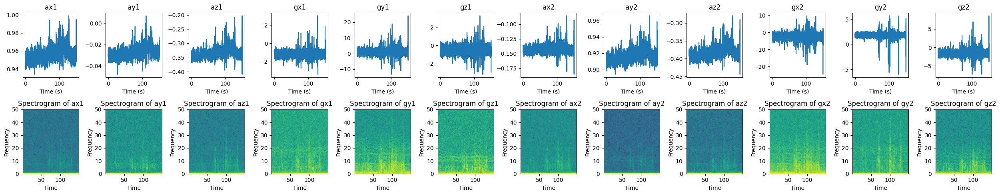

Plot of P20V3_F5.csv


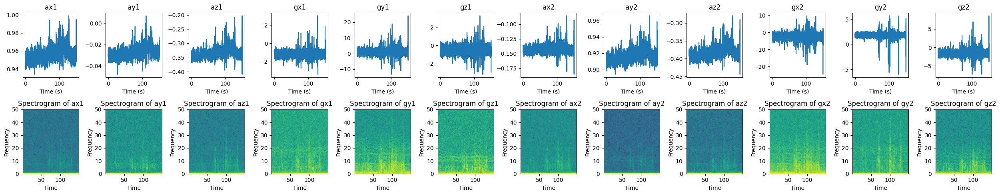

Plot of P20V3_L5.csv


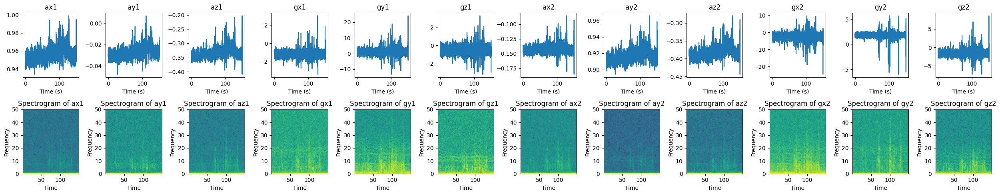

In [18]:
import matplotlib.pyplot as plt
import numpy as np

Fs = 100 #Hz
columns = df.columns[2:-1]

# Iterate over each file
for file_path in file_list:
    # Read the CSV file into a pandas dataframe
    df_copy_copy_copy = pd.read_csv(file_path)
    title = file_path.split("\\")[-1]
    print(f"Plot of {title}")

    fig, axes = plt.subplots(nrows=2, ncols=len(columns), figsize=(25, 5))
    axes = axes.flatten()

    for i, column in enumerate(columns):
        t = np.arange(0, len(df[column])/Fs, 1/Fs)
        axes[i].plot(t, df[column])
        axes[i].set_title(column)
        axes[i].set_xlabel('Time (s)')

        # axes[i+len(columns)].magnitude_spectrum(df[column], Fs=Fs, scale='dB', color='C1')
        axes[i+len(columns)].specgram(df[column], Fs=Fs)
        axes[i+len(columns)].set_xlabel('Time')
        axes[i+len(columns)].set_ylabel('Frequency')
        axes[i+len(columns)].set_title(f'Spectrogram of {column}')
    

    plt.tight_layout()
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def get_file_path(filename, file_list):
    for file_path in file_list:
        if filename in file_path:
            return file_path
    return np.nan

filename = "P20V2_F5.csv"
channel = "gy1"
file_path = get_file_path(filename, file_list)
print(file_path)

Fs = 100 #Hz
columns = df.columns[2:-1]

# Read the CSV file into a pandas dataframe
df = pd.read_csv(file_path)

selected_column = df[channel]

title = file_path.split("\\")[-1]
print(f"Plot of {title}")

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 5))

# Plot the time series
t = np.arange(0, len(selected_column)/Fs, 1/Fs)
axes[0].plot(t, selected_column)
axes[0].set_title(channel)
axes[0].set_xlabel('Time (s)')

# Plot the spectrogram
axes[1].specgram(selected_column, Fs=Fs)
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Frequency')
axes[1].set_title(f'Spectrogram of {channel}')

plt.tight_layout()
plt.show()

In [ ]:
time1 = 0
time2 = 147

# Truncate the selected channel between time1 and time2
truncated_df = df[(t >= time1) & (t <= time2)]
selected_column = truncated_df[channel]

# Plot the truncated signal and spectrogram
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 5))

# Plot the time series
truncated_t = np.arange(0, len(selected_column)/Fs, 1/Fs)
axes[0].plot(truncated_t, selected_column)
axes[0].set_title(channel)
axes[0].set_xlabel('Time (s)')

# Plot the spectrogram
axes[1].specgram(selected_column, Fs=Fs)
axes[1].set_xlabel('Time')
axes[1].set_ylabel('Frequency')
axes[1].set_title(f'Spectrogram of {channel}')

plt.tight_layout()
plt.show()


In [ ]:
# time1 = 147
# time2 = 160

# # Step 1: Identify indices for time1 and time2
# index1 = np.where(t == time1)[0][0]
# index2 = np.where(t == time2)[0][0]

# # Step 2: Create boolean mask
# mask = np.ones_like(t, dtype=bool)
# mask[index1:index2+1] = False

# # Step 3: Filter t and df using the mask
# filtered_t = t[mask]
# filtered_df = df.loc[mask]

# # Step 4: Interpolate the filtered values
# interpolated_df = filtered_df.interpolate(method='spline', order=3, axis=0)

# # Step 5: Replace filtered values in the original df with interpolated values
# df.loc[mask] = interpolated_df

# import matplotlib.pyplot as plt
# from scipy import signal

# # Plot the new signal
# plt.figure(figsize=(10, 5))
# plt.plot(t, selected_column)
# plt.xlabel('Time (s)')
# plt.ylabel('Amplitude')
# plt.title('New Signal')
# plt.grid(True)
# plt.show()

# # Compute and plot the spectrogram
# frequencies, times, spectrogram = signal.spectrogram(selected_column, Fs)
# plt.figure(figsize=(10, 5))
# plt.pcolormesh(times, frequencies, 10 * np.log10(spectrogram))
# plt.colorbar(label='Power Spectral Density (dB/Hz)')
# plt.xlabel('Time (s)')
# plt.ylabel('Frequency (Hz)')
# plt.title('Spectrogram')
# plt.grid(True)
# plt.show()

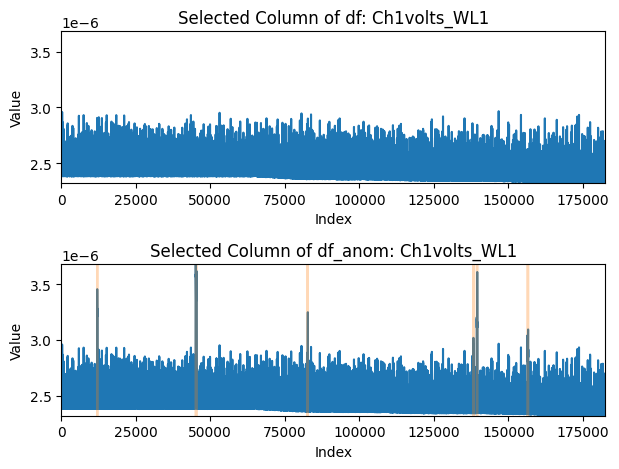

In [24]:
import pandas as pd
import glob

file_path = "TFO Data\\PPG\\Clean PPG\\HR4.csv"
df = pd.read_csv(file_path)

anom_directory = "TFO Data\\PPG\\Artificial Anomalies\\datafiles"
anom_files = glob.glob(anom_directory + "\\HR4*.csv")

file_num = 9
column = df.columns[0]

file = anom_files[file_num]

key = file.split('_')[-1].split('.')[0]

directory = "TFO Data\\PPG\\Artificial Anomalies\\anomaly indices"

file_list = glob.glob(directory + "\\" + f"*_{key}.csv")
file_path_indices = file_list[0] if file_list else None

if file_path_indices:
    anomaly_indices = pd.read_csv(file_path_indices)
else:
    anomaly_indices = None

df_anom = pd.read_csv(file)

import matplotlib.pyplot as plt

# Plot the selected column of df
plt.subplot(2, 1, 1)
plt.plot(df[column])
plt.title(f"Selected Column of df: {column}")
plt.xlabel('Index')
plt.ylabel('Value')
plt.xlim(0, len(df))
plt.ylim(min(df_anom[column]), max(df_anom[column]))

# Plot the selected column of df_anom
plt.subplot(2, 1, 2)
plt.plot(df_anom[column], zorder=1)
plt.title(f"Selected Column of df_anom: {column}")
plt.xlabel('Index')
plt.ylabel('Value')
plt.xlim(0, len(df_anom))
plt.ylim(min(df_anom[column]), max(df_anom[column]))

# Draw semitransparent bars on the plot where anomaly_indices is True
# for i, is_anomaly in enumerate(anomaly_indices[column]):
#     if is_anomaly:
#         plt.axvspan(i, i+1, facecolor='red', alpha=0.7, zorder=2)

plt.plot(anomaly_indices[column], alpha=0.3, zorder=2, color='red')
plt.xlim(0, len(anomaly_indices))

plt.tight_layout()
plt.show()